# 1) Attack
* Using Robustness Library
* Using MiniImagenet from Kaggle Dataset
* Using ResNet robustness model with $\epsilon = 3$

In [ ]:
imagenet_path = '/content/ImageNet2012/imagenet-mini'  # If you are running this on a local server, change this path
resnet50_checkpoint_path = '/content/imagenet_l2_3_0.pt'

In [ ]:
# Install a fork of the robustness library into this colab environment.
# Note: you can make modifications to your copy of the robustness library and then use them here!
!git clone  https://github.com/morganbdt/robustness.git
%cd /content/robustness
!pip install --editable .
!find . -type f -name 'log.txt' -exec sed -i 's/from torch.hub import load_state_dict_from_url/from torch.hub import load_state_dict_from_url/g' {} \;

In [ ]:
#-------------------------------------------------- SET DATA SET ---------------------------------------------------
import torch as ch
from robustness.datasets import ImageNet

In [ ]:
# Create a directory for the Stanford Cars dataset
!mkdir /content/StanfordCars
%cd /content/StanfordCars

# Download the dataset from Kaggle
!kaggle datasets download -d jutrera/stanford-car-dataset-by-classes-folder
# Unzip the downloaded dataset
!unzip -q stanford-car-dataset-by-classes-folder.zip

/content/StanfordCars
Dataset URL: https://www.kaggle.com/datasets/jutrera/stanford-car-dataset-by-classes-folder
License(s): other
100% 1.82G/1.83G [01:45<00:00, 15.2MB/s]
100% 1.83G/1.83G [01:45<00:00, 18.6MB/s]


In [ ]:
!mkdir /content/ImageNet2012
%cd /content/ImageNet2012
!kaggle datasets download -d ifigotin/imagenetmini-1000
!unzip -q imagenetmini-1000.zip

/content/ImageNet2012
Dataset URL: https://www.kaggle.com/datasets/ifigotin/imagenetmini-1000
License(s): unknown
100% 3.92G/3.92G [03:44<00:00, 17.5MB/s]
100% 3.92G/3.92G [03:44<00:00, 18.8MB/s]


In [ ]:
ds = ImageNet(imagenet_path)

In [ ]:
# ------------------------------- INSTANTIATE MODEL -----------------------------------
%cd /content/
!wget https://www.dropbox.com/s/knf4uimlqsi1yz8/imagenet_l2_3_0.pt

/content
--2024-08-22 00:00:11--  https://www.dropbox.com/s/knf4uimlqsi1yz8/imagenet_l2_3_0.pt
Resolving www.dropbox.com (www.dropbox.com)... 162.125.81.18, 2620:100:601d:18::a27d:512
Connecting to www.dropbox.com (www.dropbox.com)|162.125.81.18|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: /s/raw/knf4uimlqsi1yz8/imagenet_l2_3_0.pt [following]
--2024-08-22 00:00:11--  https://www.dropbox.com/s/raw/knf4uimlqsi1yz8/imagenet_l2_3_0.pt
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc5fca9a2ea5f2be90afd8986322.dl.dropboxusercontent.com/cd/0/inline/CZGryYFt2sSbI5keC_ZJFvgXBBp_GnGnsxPko6aKLYT35uxpMS9I3F95fJ1WAkfBtNp92aMyMen-MfOUdkmRPjJvl4sys0RJ-mP2e6QfsGGP9X3DrF9Hl_Iu11esJCmYJVuOPnfMhIq_NWevzSFnk6l9/file# [following]
--2024-08-22 00:00:12--  https://uc5fca9a2ea5f2be90afd8986322.dl.dropboxusercontent.com/cd/0/inline/CZGryYFt2sSbI5keC_ZJFvgXBBp_GnGnsxPko6aKLYT35uxpMS9I3F95fJ1WAkfBtNp92aMyM

In [ ]:
from torch.utils.data import Subset, DataLoader

In [ ]:
from robustness.model_utils import make_and_restore_model
device = ch.device("cuda" if ch.cuda.is_available() else "cpu")
model, _ = make_and_restore_model(arch='resnet50', dataset=ds, resume_path=resnet50_checkpoint_path)
model.to(device)
model.eval()
print('Model loaded')

=> loading checkpoint '/content/imagenet_l2_3_0.pt'
=> loaded checkpoint '/content/imagenet_l2_3_0.pt' (epoch 105)
Model loaded


In [ ]:
# ------------------------------------------- SET UP LOADERS ---------------------------------------------
ATTACK_EPS = 20
ATTACK_STEPSIZE = 0.5
ATTACK_STEPS = 50
NUM_WORKERS = 2
BATCH_SIZE = 25

In [ ]:
training_loader, test_loader = ds.make_loaders(workers=NUM_WORKERS, batch_size=BATCH_SIZE)
_, (im, label) = next(enumerate(test_loader))
im = im.to(device)
label = label.to(device)

==> Preparing dataset imagenet..


In [ ]:
label

tensor([975, 677, 912, 199, 502, 626, 565, 807, 517, 652, 535, 977, 737, 650,
        398, 118, 796, 606, 790, 560, 206,  91, 644, 936, 223],
       device='cuda:0')

## 1.1) Attack : Enhance True Class

In [ ]:
from robustness.tools.vis_tools import show_image_row
from robustness.tools.label_maps import CLASS_DICT
IMAGENET_DICT_SHORT = {key: value.split(',')[0] for key, value in CLASS_DICT['ImageNet'].items()}

In [ ]:
kwargs = {
    'constraint':'2',
    'eps': ATTACK_EPS,
    'step_size': ATTACK_STEPSIZE,
    'iterations': ATTACK_STEPS,
    'targeted': True,
    'do_tqdm': True
}

In [ ]:
targ = label
_, im_adv = model(im, targ, make_adv=True, **kwargs)

Current loss: 0.04885951429605484: 100%|██████████| 50/50 [00:04<00:00, 10.73it/s]


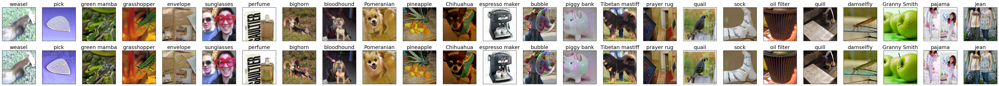

In [ ]:
# Get predicted labels for adversarial examples
pred, _ = model(im_adv)
label_pred = ch.argmax(pred, dim=1)

# Visualize test set images, along with corresponding enhanced examples
show_image_row([im.cpu(), im_adv.cpu()],
         tlist=[[IMAGENET_DICT_SHORT[int(t)] for t in l] for l in [label, label_pred]],
         fontsize=18,
         filename='./enhanced_example_ImageNet.png')

In [ ]:
labels_pred_text = [[IMAGENET_DICT_SHORT[int(t)] for t in l] for l in [label_pred]][0]
labels_orig_text = [[IMAGENET_DICT_SHORT[int(t)] for t in l] for l in [label]][0]

In [ ]:
# prompt: define a function to plot and save adversairal images from position n to n + d from im_adv
def plot_save_adv(n, d):
  for i in range(n, n+d):
    plt.figure(figsize=(5,5))
    plt.axis('off')
    plt.imshow((im.cpu()[i - 1].permute(1, 2, 0)))
    plt.title(f'Normal Image: {labels_orig_text[i - 1]}')
    plt.savefig('/content/original/original_image_ImageNet_{}.png'.format((i)))
    plt.show()

    plt.figure(figsize=(5,5))
    plt.axis('off')
    plt.imshow((im_adv.cpu()[i - 1].permute(1, 2, 0)))
    plt.title(f'Enhanced Category: {labels_pred_text[i - 1]}')
    plt.savefig('/content/enhanced/enhanced_example_ImageNet_{}.png'.format((i)))
    plt.show()

In [ ]:
plot_save_adv(1, 10)

# 1.2) Attack in Sports Car

In [ ]:
import torch
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
test_dataset = test_loader.dataset  # or test_loader.dataset, depending on which loader you want to filter

# Function to get indices for specific classes
def get_class_indices(dataset, target_class):
    return [i for i, (_, label) in enumerate(dataset) if label == target_class]

# Example: Create subloaders for class 0 and class 1
class_0_indices = get_class_indices(test_dataset, target_class=817)
#class_1_indices = get_class_indices(test_dataset, target_class=1)

# Create subsets
subset_class_0 = Subset(test_dataset, class_0_indices)
#subset_class_1 = Subset(test_dataset, class_1_indices)

# Create new DataLoaders for each subset
subloader_class_0 = DataLoader(subset_class_0, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS)
#subloader_class_1 = DataLoader(subset_class_1, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS)

# Function to get indices for specific classes
def get_class_indices(dataset, target_class):
    return [i for i, (_, label) in enumerate(dataset) if label == target_class]

# Example: Create subloaders for class 0 and class 1
class_0_indices = get_class_indices(test_dataset, target_class=817)
#class_1_indices = get_class_indices(test_dataset, target_class=1)

# Create subsets
subset_class_0 = Subset(test_dataset, class_0_indices)
#subset_class_1 = Subset(test_dataset, class_1_indices)

# Create new DataLoaders for each subset
subloader_class_0 = DataLoader(subset_class_0, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS)
#subloader_class_1 = DataLoader(subset_class_1, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS)


In [ ]:
_, (im, label) = next(enumerate(subloader_class_0))
im = im.to(device)
label = label.to(device)

# 1.3) Attack in Sports Car



In [ ]:
import torch
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
import numpy as np
import matplotlib.pyplot as plt
CLASS_DICT['ImageNet'][817]

'sports car, sport car'

In [ ]:
IMG_SIZE = 512
BATCH_SIZE = 1


def load_transformed_dataset():
    data_transforms = [
        transforms.Resize((IMG_SIZE, IMG_SIZE)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(), # Scales data into [0,1]
#        transforms.Lambda(lambda t: (t * 2) - 1) # Scale between [-1, 1]
    ]
    data_transform = transforms.Compose(data_transforms)
    #Apply transformations to dataloader
    train = datasets.ImageFolder(root='/content/StanfordCars/car_data/car_data/train', transform=data_transform)
    test = datasets.ImageFolder(root='/content/StanfordCars/car_data/car_data/test', transform=data_transform)
   # train = datasets.ImageFolder(root='/content/ImageNet2012/imagenet-mini/train', transform=data_transform)
   # test = datasets.ImageFolder(root='/content/ImageNet2012/imagenet-mini/val', transform=data_transform)
    return torch.utils.data.ConcatDataset([train, test]), train, test

'''
def show_tensor_image(image, fig_size = 15):
    reverse_transforms = transforms.Compose([
        transforms.Lambda(lambda t: (t + 1) / 2),
        transforms.Lambda(lambda t: t.permute(1, 2, 0)), # CHW to HWC
        transforms.Lambda(lambda t: t * 255.),
        transforms.Lambda(lambda t: t.numpy().astype(np.uint8)),
        transforms.ToPILImage(),
    ])

    # Take first image of batch
    if len(image.shape) == 4:
        image = image[0, :, :, :]
    plt.imshow(reverse_transforms(image))
'''

data, train_stanford, test_stanford = load_transformed_dataset()

train_loader_stanford = DataLoader(train_stanford, batch_size=BATCH_SIZE, shuffle=True, drop_last=True)
test_loader_stanford = DataLoader(test_stanford, batch_size=BATCH_SIZE, shuffle=False, drop_last=True)
dataloader = DataLoader(data, batch_size=BATCH_SIZE, shuffle=True, drop_last=True)

In [ ]:
_, (im, label) = next(enumerate(test_loader_stanford))
im = im.to(device)
label = label.to(device)
im.shape

torch.Size([1, 3, 512, 512])

In [ ]:
import os
_, im_adv = model(im, label, make_adv=True, **kwargs)

Current loss: 0.30329933762550354: 100%|██████████| 50/50 [00:01<00:00, 27.09it/s]


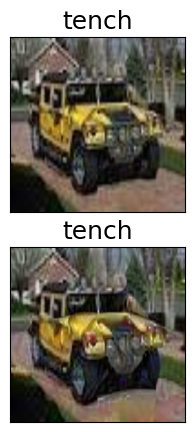

In [ ]:
# Get predicted labels for adversarial examples
pred, _ = model(im_adv)
label_pred = ch.argmax(pred, dim=1)

# Visualize test set images, along with corresponding enhanced examples
show_image_row([im.cpu(), im_adv.cpu()],
         tlist=[[IMAGENET_DICT_SHORT[int(t)] for t in l] for l in [label, label_pred]],
         fontsize=18,
         filename='./enhanced_example_ImageNet.png')

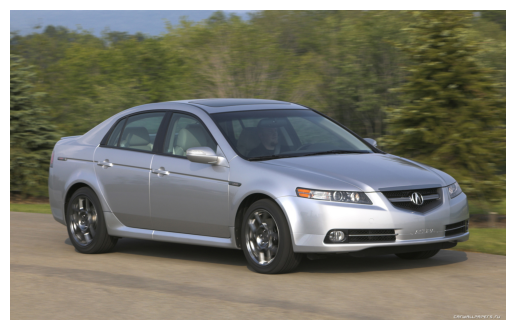

In [ ]:
from PIL import Image

image_path = '/content/StanfordCars/car_data/car_data/test/Acura TL Type-S 2008/00534.jpg'
init_image = Image.open(image_path)
#init_image = init_image.resize((512, 512))
plt.imshow(init_image)
plt.axis('off')
plt.show()

In [ ]:
import os
from torchvision import models, transforms
from PIL import Image
from torchvision.transforms import ToPILImage


In [ ]:
ATTACK_EPS

20

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


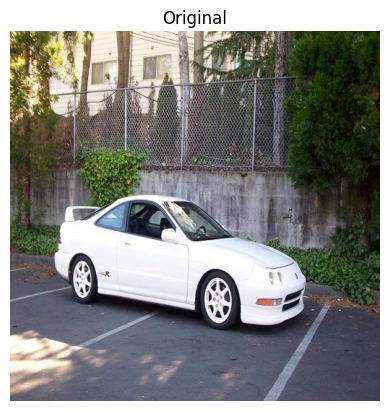

label: tensor([656], device='cuda:0')


Current loss: 1.2790166139602661: 100%|██████████| 50/50 [00:00<00:00, 50.74it/s]


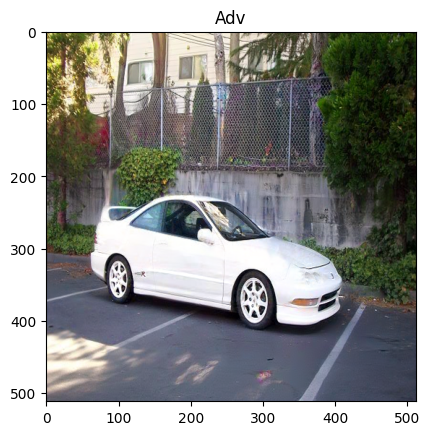

22: 07108.jpg


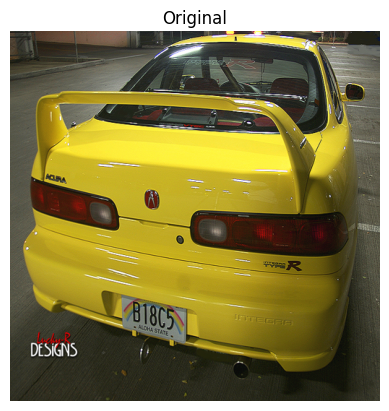

label: tensor([656], device='cuda:0')


Current loss: 1.366165280342102: 100%|██████████| 50/50 [00:00<00:00, 51.51it/s]


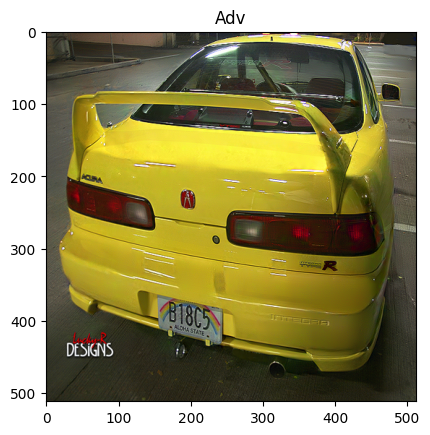

23: 04951.jpg


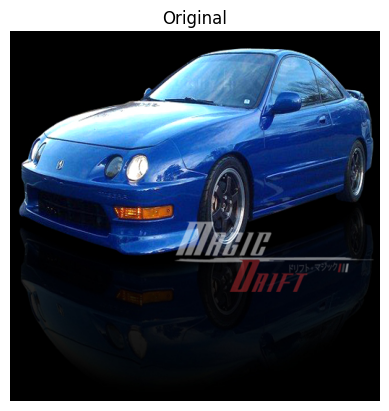

label: tensor([656], device='cuda:0')


Current loss: 1.3007683753967285: 100%|██████████| 50/50 [00:00<00:00, 51.48it/s]


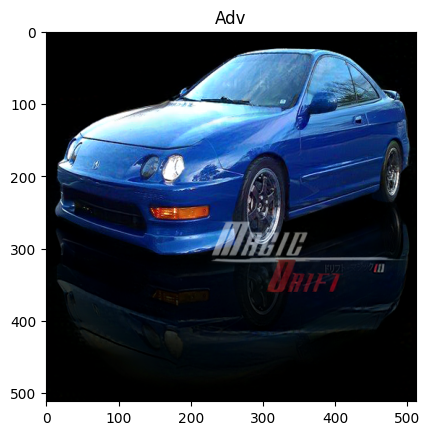

24: 02433.jpg


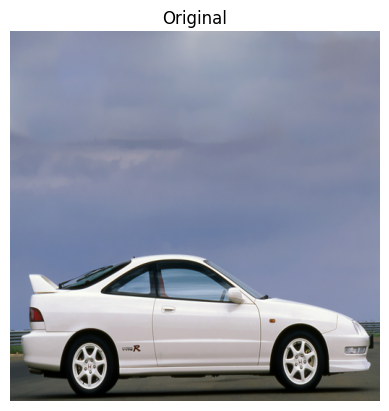

label: tensor([623], device='cuda:0')


Current loss: 4.63017463684082: 100%|██████████| 50/50 [00:00<00:00, 51.25it/s]


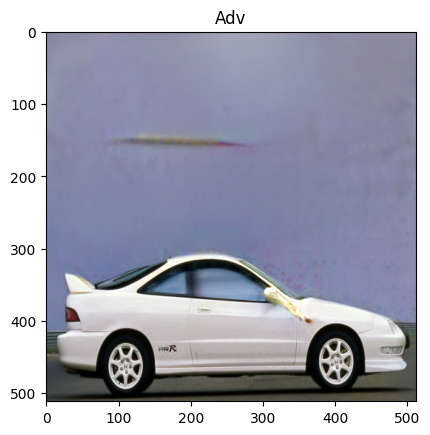

25: 05667.jpg


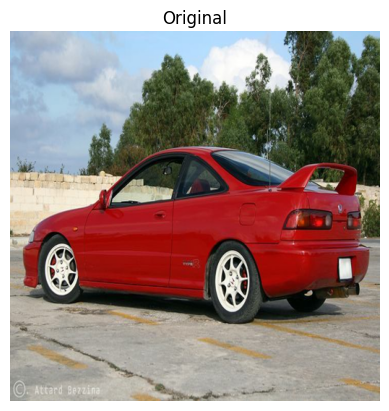

label: tensor([656], device='cuda:0')


Current loss: 1.0927919149398804: 100%|██████████| 50/50 [00:00<00:00, 51.12it/s]


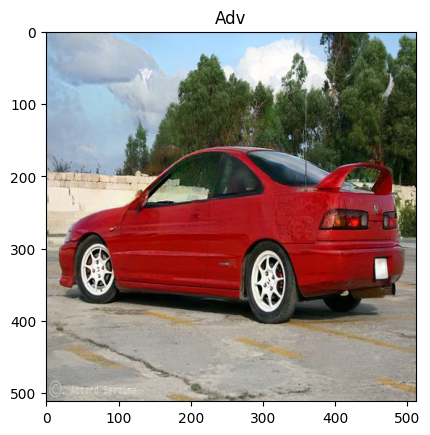

26: 03748.jpg


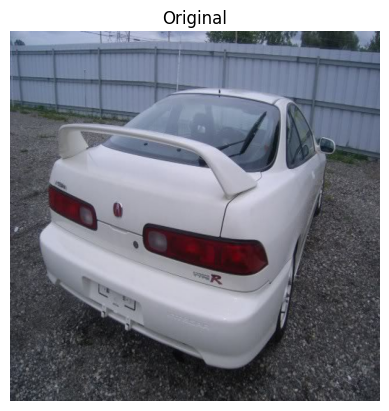

label: tensor([876], device='cuda:0')


Current loss: 1.464522123336792: 100%|██████████| 50/50 [00:00<00:00, 50.82it/s]


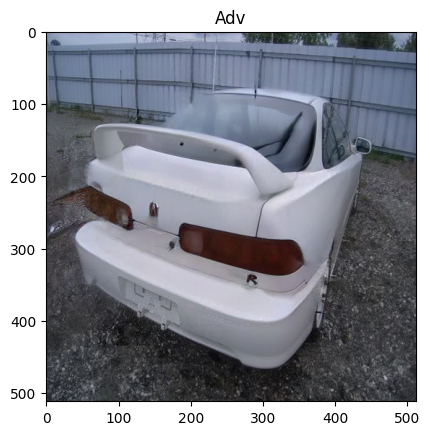

27: 05581.jpg


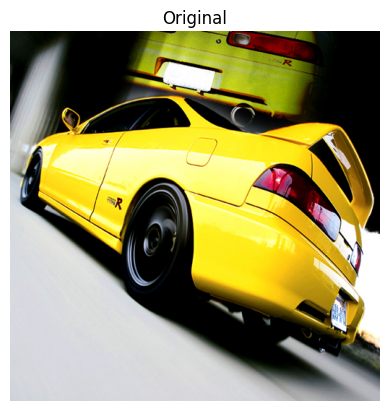

label: tensor([511], device='cuda:0')


Current loss: 1.3866075277328491: 100%|██████████| 50/50 [00:00<00:00, 50.43it/s]


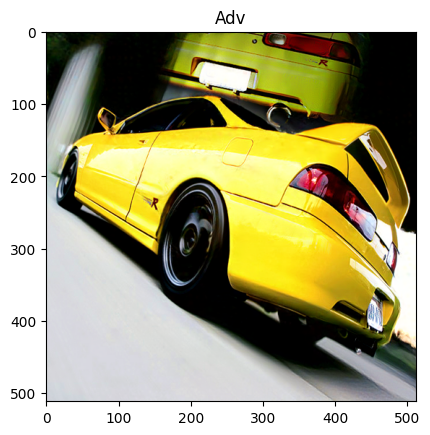

28: 02182.jpg


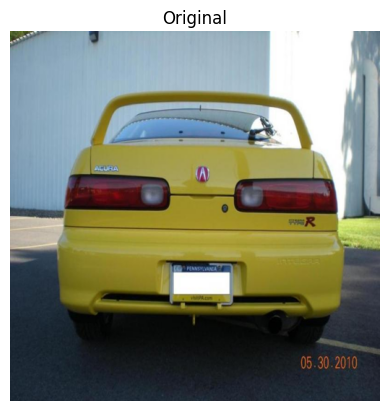

label: tensor([742], device='cuda:0')


Current loss: 2.1869475841522217: 100%|██████████| 50/50 [00:00<00:00, 51.52it/s]


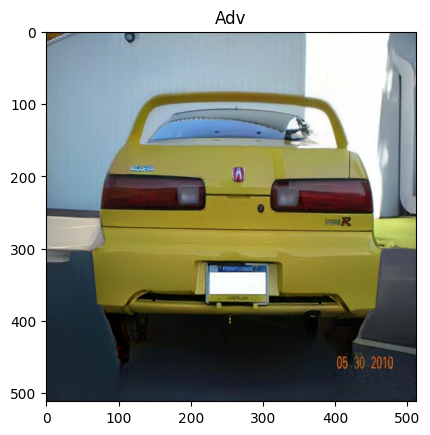

29: 05081.jpg


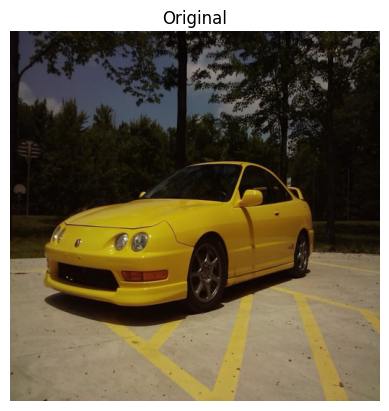

label: tensor([656], device='cuda:0')


Current loss: 1.6376878023147583: 100%|██████████| 50/50 [00:00<00:00, 50.49it/s]


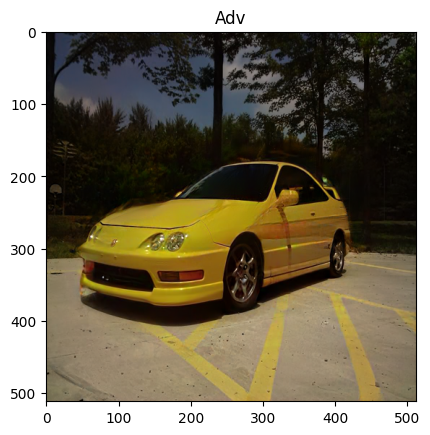

30: 03056.jpg


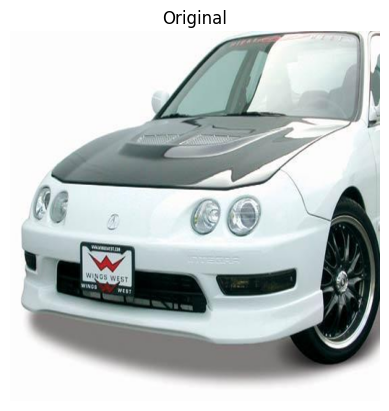

label: tensor([656], device='cuda:0')


Current loss: 0.9767090678215027: 100%|██████████| 50/50 [00:01<00:00, 49.46it/s]


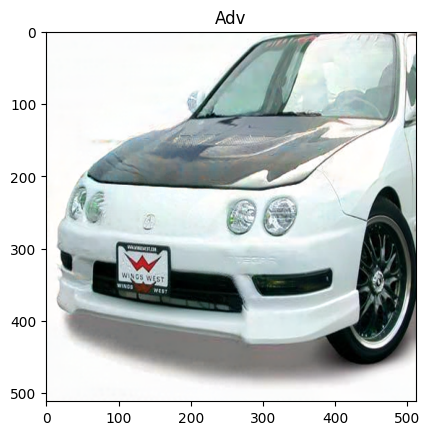

31: 00565.jpg


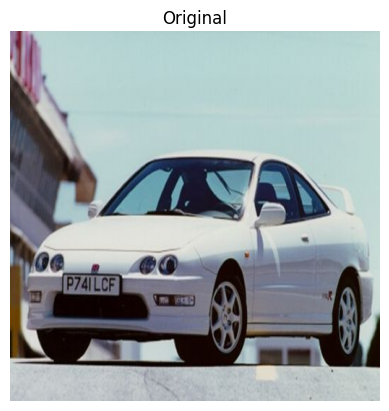

label: tensor([656], device='cuda:0')


Current loss: 2.4586524963378906:  10%|█         | 5/50 [00:00<00:00, 48.89it/s]


KeyboardInterrupt: 

In [ ]:
dir = os.listdir('/content/StanfordCars/car_data/car_data/test/Acura Integra Type R 2001')
image_paths = [os.path.join('/content/StanfordCars/car_data/car_data/test/Acura Integra Type R 2001', file) for file in dir]

# 1. Load a pretrained ResNet-18 model
model_resnet = models.resnet18(pretrained=True)
model_resnet.eval()  # Set the model to evaluation mode
model_resnet.to(device)

kwargs = {
    'constraint':'2',
    'eps': 60,
    'step_size': ATTACK_STEPSIZE,
    'iterations': ATTACK_STEPS,
    'targeted': True,
    'do_tqdm': True
}

for i in range(int(len(image_paths)/2), int(len(image_paths))):
  init_image = Image.open(image_paths[i])
  init_image = init_image.resize((512, 512))
  #if i == 19 or i == 20:
  #  init_image.save(f'original image {i}.png')
  plt.imshow(init_image)
  plt.axis('off')
  plt.title(f'Original')
  plt.show()

  # make init_image to tensor
  transf = transforms.Compose([
    transforms.Resize((512, 512)),
    transforms.ToTensor(),
  ])

  init_image = transf(init_image)
  init_image = init_image.to(device)
  init_image.unsqueeze(0).shape

  with torch.no_grad():
    output = model_resnet(init_image.unsqueeze(0))

  _, predicted_idx = torch.max(output, 1)

  label = torch.tensor([predicted_idx]).to(device)
  print(f'label: {label}')

  _, im_adv = model(init_image.unsqueeze(0), label, make_adv=True, **kwargs)

  to_pil = ToPILImage()
  pil_image = to_pil(im_adv.squeeze(0))
  plt.imshow(pil_image)
  plt.title(f'Adv')
  plt.show()
  print(f'{i}: {dir[i]}')
  #save image
 # if i == 19 or i == 20:
 #   pil_image.save(f'enhanced_image {i}.png')

# 2) Difussion

In [ ]:
import torch
import torchvision
import matplotlib.pyplot as plt
import torch.nn.functional as F
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import numpy as np

## 2.1) Transform Images + Forward

* Linear distribution of beta (could be cosine, cuadratic, etc)


In [ ]:
import torch
device = "cuda" if torch.cuda.is_available() else "cpu"

In [ ]:
device

'cuda'

In [ ]:
# Create a directory for the Stanford Cars dataset
!mkdir /content/StanfordCars
%cd /content/StanfordCars

# Download the dataset from Kaggle
!kaggle datasets download -d jutrera/stanford-car-dataset-by-classes-folder

# Unzip the downloaded dataset
!unzip -q stanford-car-dataset-by-classes-folder.zip


/content/StanfordCars
Dataset URL: https://www.kaggle.com/datasets/jutrera/stanford-car-dataset-by-classes-folder
License(s): other
100% 1.82G/1.83G [00:21<00:00, 108MB/s] 
100% 1.83G/1.83G [00:21<00:00, 89.6MB/s]


In [ ]:
# Define the transformations
transform = transforms.Compose([
    transforms.Resize((64, 64)),  # Resize images to 224x224
    transforms.ToTensor(),          # Convert images to PyTorch tensors
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize with ImageNet standards
])

In [ ]:
# Load train and test datasets
train_dataset = datasets.ImageFolder(root='/content/StanfordCars/car_data/car_data/train', transform=transform)
test_dataset = datasets.ImageFolder(root='/content/StanfordCars/car_data/car_data/test', transform=transform)

# Define dataloaders
train_loader = DataLoader(dataset=train_dataset, batch_size=32, shuffle=True, num_workers=2)
test_loader = DataLoader(dataset=test_dataset, batch_size=32, shuffle=False, num_workers=2)

In [ ]:
#IMG_SIZE = im_adv.shape[-1]
IMG_SIZE = 64
BATCH_SIZE = 128


In [ ]:
IMG_SIZE = 64
BATCH_SIZE = 128

def load_transformed_dataset():
    data_transforms = [
        transforms.Resize((IMG_SIZE, IMG_SIZE)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(), # Scales data into [0,1]
        transforms.Lambda(lambda t: (t * 2) - 1) # Scale between [-1, 1]
    ]
    data_transform = transforms.Compose(data_transforms)
    #Apply transformations to dataloader
    train = datasets.ImageFolder(root='/content/StanfordCars/car_data/car_data/train', transform=data_transform)
    test = datasets.ImageFolder(root='/content/StanfordCars/car_data/car_data/test', transform=data_transform)

    return torch.utils.data.ConcatDataset([train, test])
def show_tensor_image(image):
    reverse_transforms = transforms.Compose([
        transforms.Lambda(lambda t: (t + 1) / 2),
        transforms.Lambda(lambda t: t.permute(1, 2, 0)), # CHW to HWC
        transforms.Lambda(lambda t: t * 255.),
        transforms.Lambda(lambda t: t.numpy().astype(np.uint8)),
        transforms.ToPILImage(),
    ])

    # Take first image of batch
    if len(image.shape) == 4:
        image = image[0, :, :, :]
    plt.imshow(reverse_transforms(image))

data = load_transformed_dataset()
dataloader = DataLoader(data, batch_size=BATCH_SIZE, shuffle=True, drop_last=True)

In [ ]:
def get_index_from_list(vals, t, x_shape):
    """
    Returns a specific index t of a passed list of values vals
    while considering the batch dimension.
    """
    batch_size = t.shape[0]
    out = vals.gather(-1, t.cpu())
    return out.reshape(batch_size, *((1,) * (len(x_shape) - 1))).to(t.device)

In [ ]:
data_transforms = [
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),  # Scales data into [0,1]
    transforms.Lambda(lambda t: (t * 2) - 1)  # Scale between [-1, 1]
]
data_transform = transforms.Compose(data_transforms)

# Function to apply the transformation to a batch of images
def apply_transforms_to_tensor_images(tensor_images):
    transformed_images = []
    for img in tensor_images:
        pil_image = transforms.ToPILImage()(img)  # Convert tensor to PIL image
        transformed_image = data_transform(pil_image)  # Apply transformations
        transformed_images.append(transformed_image)

    return torch.stack(transformed_images)

In [ ]:
#Apply transformations to dataloader
#train_dataset_transformed = datasets.ImageFolder(root='/content/ImageNet2012/imagenet-mini/train', transform=data_transform)
#test_dataset_transformed = datasets.ImageFolder(root='/content/ImageNet2012/imagenet-mini/val', transform=data_transform)

# Create dataloaders
#train_loader_transformed = DataLoader(train_dataset_transformed, batch_size=BATCH_SIZE, shuffle=True, drop_last=True) #DO NOT KNOW WHY I DROP LAST ONE
#test_loader_transformed = DataLoader(test_dataset_transformed, batch_size=BATCH_SIZE, shuffle=False, drop_last=True)

In [ ]:
def linear_beta_schedule(timesteps, start=0.0001, end=0.02):
    return torch.linspace(start, end, timesteps)

def get_index_from_list(vals, t, x_shape):
    """
    Returns a specific index t of a passed list of values vals
    while considering the batch dimension.
    """
    batch_size = t.shape[0]
    out = vals.gather(-1, t.cpu())
    return out.reshape(batch_size, *((1,) * (len(x_shape) - 1))).to(t.device)

def forward_diffusion_sample(x_0, t, device="cpu"):
    """
    Takes an image and a timestep as input and
    returns the noisy version of it
    """
    noise = torch.randn_like(x_0)
    sqrt_alphas_cumprod_t = get_index_from_list(sqrt_alphas_cumprod, t, x_0.shape)
    sqrt_one_minus_alphas_cumprod_t = get_index_from_list(
        sqrt_one_minus_alphas_cumprod, t, x_0.shape
    )
    # mean + variance
    return sqrt_alphas_cumprod_t.to(device) * x_0.to(device) \
    + sqrt_one_minus_alphas_cumprod_t.to(device) * noise.to(device), noise.to(device)


# Define beta schedule
T = 100
betas = linear_beta_schedule(timesteps=T)

# Pre-calculate different terms for closed form
alphas = 1. - betas
alphas_cumprod = torch.cumprod(alphas, axis=0)
alphas_cumprod_prev = F.pad(alphas_cumprod[:-1], (1, 0), value=1.0)
sqrt_recip_alphas = torch.sqrt(1.0 / alphas)
sqrt_alphas_cumprod = torch.sqrt(alphas_cumprod)
sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - alphas_cumprod)
posterior_variance = betas * (1. - alphas_cumprod_prev) / (1. - alphas_cumprod)

In [ ]:
plt.figure(figsize=(25,25))
plt.axis('off')
num_images = 10
stepsize = int(T/num_images)

for idx in range(0, T, stepsize):
    t = torch.Tensor([idx]).type(torch.int64)
    plt.subplot(1, num_images+1, int(idx/stepsize) + 1)
    img, noise = forward_diffusion_sample(transformed_images[2], t)
    show_tensor_image(img)

## 2.2) Backward: U-Net + Loss

In [ ]:
# ------------------------Define a simple U-Net -----------------------------------

In [ ]:
from torch import nn
import math

class Block(nn.Module):
    def __init__(self, in_ch, out_ch, time_emb_dim, up=False):
        super().__init__()
        self.time_mlp =  nn.Linear(time_emb_dim, out_ch)
        if up:
            self.conv1 = nn.Conv2d(2*in_ch, out_ch, 3, padding=1)
            self.transform = nn.ConvTranspose2d(out_ch, out_ch, 4, 2, 1)
        else:
            self.conv1 = nn.Conv2d(in_ch, out_ch, 3, padding=1)
            self.transform = nn.Conv2d(out_ch, out_ch, 4, 2, 1)
        self.conv2 = nn.Conv2d(out_ch, out_ch, 3, padding=1)
        self.bnorm1 = nn.BatchNorm2d(out_ch)
        self.bnorm2 = nn.BatchNorm2d(out_ch)
        self.relu  = nn.ReLU()

    def forward(self, x, t, ):
        # First Conv
        h = self.bnorm1(self.relu(self.conv1(x)))
        # Time embedding
        time_emb = self.relu(self.time_mlp(t))
        # Extend last 2 dimensions
        time_emb = time_emb[(..., ) + (None, ) * 2]
        # Add time channel
        h = h + time_emb
        # Second Conv
        h = self.bnorm2(self.relu(self.conv2(h)))
        # Down or Upsample
        return self.transform(h)


class SinusoidalPositionEmbeddings(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, time):
        device = time.device
        half_dim = self.dim // 2
        embeddings = math.log(10000) / (half_dim - 1)
        embeddings = torch.exp(torch.arange(half_dim, device=device) * -embeddings)
        embeddings = time[:, None] * embeddings[None, :]
        embeddings = torch.cat((embeddings.sin(), embeddings.cos()), dim=-1)
        # TODO: Double check the ordering here
        return embeddings


class SimpleUnet(nn.Module):
    """
    A simplified variant of the Unet architecture.
    """
    def __init__(self):
        super().__init__()
        image_channels = 3
        down_channels = (64, 128, 256, 512, 1024)
        up_channels = (1024, 512, 256, 128, 64)
        out_dim = 3
        time_emb_dim = 32

        # Time embedding
        self.time_mlp = nn.Sequential(
                SinusoidalPositionEmbeddings(time_emb_dim),
                nn.Linear(time_emb_dim, time_emb_dim),
                nn.ReLU()
            )

        # Initial projection
        self.conv0 = nn.Conv2d(image_channels, down_channels[0], 3, padding=1)

        # Downsample
        self.downs = nn.ModuleList([Block(down_channels[i], down_channels[i+1], \
                                    time_emb_dim) \
                    for i in range(len(down_channels)-1)])
        # Upsample
        self.ups = nn.ModuleList([Block(up_channels[i], up_channels[i+1], \
                                        time_emb_dim, up=True) \
                    for i in range(len(up_channels)-1)])

        # Edit: Corrected a bug found by Jakub C (see YouTube comment)
        self.output = nn.Conv2d(up_channels[-1], out_dim, 1)

    def forward(self, x, timestep):
        # Embedd time
        t = self.time_mlp(timestep)
        # Initial conv
        x = self.conv0(x)
        # Unet
        residual_inputs = []
        for down in self.downs:
            x = down(x, t)
            residual_inputs.append(x)
        for up in self.ups:
            residual_x = residual_inputs.pop()
            # Add residual x as additional channels
            x = torch.cat((x, residual_x), dim=1)
            x = up(x, t)
        return self.output(x)

model_u = SimpleUnet()
print("Num params: ", sum(p.numel() for p in model_u.parameters()))
model_u.to(device)

In [ ]:
model_cars = torch.load('/content/model_cars.pth')

In [ ]:
#----------------------------------------LOSS-------------------------------------------------------
def get_loss(model, x_0, t):
    x_noisy, noise = forward_diffusion_sample(x_0, t, device)
    noise_pred = model(x_noisy, t)
    return F.l1_loss(noise, noise_pred).to(device)

## 2.3) Sampling + Training

In [ ]:
from torch.optim import Adam

In [ ]:
def forward_diffusion_sample(x_0, t, device="cpu"):
    """
    Takes an image and a timestep as input and
    returns the noisy version of it
    """
    noise = torch.randn_like(x_0)
    sqrt_alphas_cumprod_t = get_index_from_list(sqrt_alphas_cumprod, t, x_0.shape)
    sqrt_one_minus_alphas_cumprod_t = get_index_from_list(
        sqrt_one_minus_alphas_cumprod, t, x_0.shape
    )
    # mean + variance
    return sqrt_alphas_cumprod_t.to(device) * x_0.to(device) \
    + sqrt_one_minus_alphas_cumprod_t.to(device) * noise.to(device), noise.to(device)



In [ ]:
@torch.no_grad()
def sample_timestep(x, t):
    """
    Calls the model to predict the noise in the image and returns
    the denoised image.
    Applies noise to this image, if we are not in the last step yet.
    """
    betas_t = get_index_from_list(betas, t, x.shape).to(dtype = torch.long)
    sqrt_one_minus_alphas_cumprod_t = get_index_from_list(
        sqrt_one_minus_alphas_cumprod, t, x.shape
    ).to(device)
    sqrt_recip_alphas_t = get_index_from_list(sqrt_recip_alphas, t, x.shape).to(device)
    t = t.to(dtype=torch.long, device=device)
    # Call model (current image - noise prediction)
    model_mean = sqrt_recip_alphas_t * (
        x - betas_t * model_u(x, t) / sqrt_one_minus_alphas_cumprod_t
    )
    posterior_variance_t = get_index_from_list(posterior_variance, t, x.shape)

    if t == 0:
        # As pointed out by Luis Pereira (see YouTube comment)
        # The t's are offset from the t's in the paper
        return model_mean
    else:
        noise = torch.randn_like(x)
        return model_mean + torch.sqrt(posterior_variance_t) * noise

@torch.no_grad()
def sample_plot_image():
    device = "cuda" if torch.cuda.is_available() else "cpu"
    # Sample noise
    img_size = IMG_SIZE
    img = torch.randn((1, 3, img_size, img_size), device=device)
    plt.figure(figsize=(15,15))
    plt.axis('off')
    num_images = 10
    stepsize = int(T/num_images)

    for i in range(0,T)[::-1]:
        t = torch.full((1,), i, device=device).to(dtype=torch.long, device=device)
        img = sample_timestep(img, t)
        # Edit: This is to maintain the natural range of the distribution
        img = torch.clamp(img, -1.0, 1.0)
        img = img.to(device)  # Add this line
        if i % stepsize == 0:
            plt.subplot(1, num_images, int(i/stepsize)+1)
            show_tensor_image(img.detach().cpu())
    plt.show()


In [ ]:
@torch.no_grad()
def sample_plot_image(diff_img):
    device = "cuda" if torch.cuda.is_available() else "cpu"
    # Sample noise
    img_size = IMG_SIZE
    #img = torch.randn((1, 3, img_size, img_size), device=device)

    plt.figure(figsize=(15,15))
    plt.axis('off')
    num_images = 10
    stepsize = int(T/num_images)

    for i in range(0,T)[::-1]:
        t = torch.full((1,), i, device=device).to(dtype=torch.long, device=device)
        img = sample_timestep(diff_img, t)
        # Edit: This is to maintain the natural range of the distribution
        img = torch.clamp(img, -1.0, 1.0)
        img = img.to(device)  # Add this line
        if i % stepsize == 0:
            plt.subplot(1, num_images, int(i/stepsize)+1)
            show_tensor_image(img.detach().cpu())
    plt.show()

<ipython-input-25-ff0fdd539cb9>:46: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, num_images, int(i/stepsize)+1)


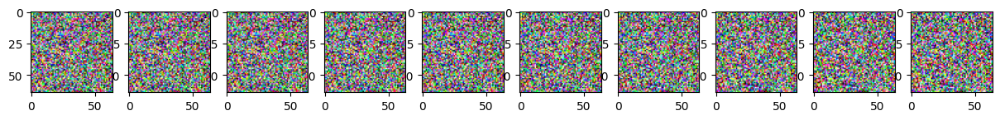

In [ ]:
sample_plot_image()

In [ ]:
import time

In [ ]:
model_u.to(device)  # Ensure model is on the same device
optimizer = Adam(model_u.parameters(), lr=0.0001)
epochs = 100
batch_size = 128


for epoch in range(epochs):
    start_time = time.time()
    print(f'Epoch:{epoch}')
    batch_acc = 0
    for step, batch in enumerate(dataloader):
        start_step_time = time.time()
        optimizer.zero_grad()
        batch = batch[0].to(device)  # Ensure batch is on the same device
        t = torch.randint(0, T, (batch_size,), device=device).long()
        loss = get_loss(model_u, batch, t)
        loss.backward()
        optimizer.step()
        sample_plot_image()
        if step % 10 == 0:
            print(f'Step:{step}')
            print(f'Delta T: {np.round(time.time() - start_step_time, 4)}, Acc T: {np.round(time.time() - start_time, 4)}')
        if epoch % 5 == 0 and step == 0:
            print(f'Step:{step}')
            print(f"Epoch {epoch} | step {step:03d} Loss: {loss.item()}")
            sample_plot_image()